# Customer Segmentation using KMeans

## Introduction

Understanding customer behavior is crucial for businesses to optimize marketing strategies and improve customer satisfaction. This project leverages machine learning techniques to segment customers into distinct groups based on their purchasing patterns and demographic characteristics. By identifying these segments, businesses can personalize their offerings and enhance customer engagement.

## Objective

The primary objective of this project is to apply clustering techniques to analyze customer data and identify meaningful segments. These insights can help businesses:

Develop targeted marketing strategies

Improve customer retention

Optimize product offerings based on customer preferences

## Import Necessary Libraries

In [96]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
from sklearn.preprocessing import OneHotEncoder,StandardScaler
from sklearn.preprocessing import MinMaxScaler,LabelEncoder
from sklearn.decomposition import PCA
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_score
import plotly.express as px
import joblib
from joblib import dump

In [2]:
data = pd.read_csv("D:\Datas\customer_segmentation_data.csv")

In [3]:
print("Dimention of the Dataset is :",data.shape)
data.tail()

Dimention of the Dataset is : (53503, 20)


,Customer ID,Age,Gender,Marital Status,Education Level,Geographic Information,Occupation,Income Level,Behavioral Data,Purchase History,Interactions with Customer Service,Insurance Products Owned,Coverage Amount,Premium Amount,Policy Type,Customer Preferences,Preferred Communication Channel,Preferred Contact Time,Preferred Language,Segmentation Group
53498,44809,35,Female,Divorced,Associate Degree,Andaman and Nicobar Islands,Salesperson,120850,policy3,01-01-2019,Mobile App,policy1,586401,4404,Family,In-Person Meeting,Phone,Afternoon,German,Segment5
53499,65485,61,Male,Single,Doctorate,Himachal Pradesh,Entrepreneur,122309,policy5,5/18/2021,Mobile App,policy4,637733,1285,Group,Text,Mail,Afternoon,German,Segment1
53500,26213,25,Male,Divorced,Doctorate,Assam,Teacher,49258,policy2,11/27/2018,In-Person,policy1,631057,4407,Individual,Text,Text,Weekends,French,Segment4
53501,63136,42,Male,Married,Doctorate,Andhra Pradesh,Artist,66301,policy4,06-04-2021,In-Person,policy1,730385,4482,Business,Mail,Phone,Morning,French,Segment5
53502,62125,20,Male,Divorced,Doctorate,Daman and Diu,Salesperson,136632,policy2,10/14/2022,Phone,policy1,743262,4499,Group,Text,In-Person Meeting,Evening,German,Segment2


## EDA

In [4]:
#summary statistics
data.describe()

,Customer ID,Age,Income Level,Coverage Amount,Premium Amount
count,53503.000000,53503.000000,53503.000000,53503.000000,53503.000000
mean,52265.204998,44.140945,82768.324318,492580.789638,3023.702447
std,28165.000067,15.079486,36651.075670,268405.505571,1285.834295
min,1.000000,18.000000,20001.000000,50001.000000,500.000000
25%,28950.500000,32.000000,51568.500000,249613.500000,1817.000000
50%,55858.000000,43.000000,80719.000000,477261.000000,3194.000000
75%,76096.000000,57.000000,115973.500000,739124.000000,4311.500000
max,100000.000000,70.000000,149999.000000,1000000.000000,5000.000000


In [5]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 53503 entries, 0 to 53502
Data columns (total 20 columns):
 #   Column                              Non-Null Count  Dtype 
---  ------                              --------------  ----- 
 0   Customer ID                         53503 non-null  int64 
 1   Age                                 53503 non-null  int64 
 2   Gender                              53503 non-null  object
 3   Marital Status                      53503 non-null  object
 4   Education Level                     53503 non-null  object
 5   Geographic Information              53503 non-null  object
 6   Occupation                          53503 non-null  object
 7   Income Level                        53503 non-null  int64 
 8   Behavioral Data                     53503 non-null  object
 9   Purchase History                    53503 non-null  object
 10  Interactions with Customer Service  53503 non-null  object
 11  Insurance Products Owned            53503 non-null  ob

Dataset contain total 53503 rows and 20 columns

In [6]:
data.isnull().sum()

Customer ID                           0
Age                                   0
Gender                                0
Marital Status                        0
Education Level                       0
Geographic Information                0
Occupation                            0
Income Level                          0
Behavioral Data                       0
Purchase History                      0
Interactions with Customer Service    0
Insurance Products Owned              0
Coverage Amount                       0
Premium Amount                        0
Policy Type                           0
Customer Preferences                  0
Preferred Communication Channel       0
Preferred Contact Time                0
Preferred Language                    0
Segmentation Group                    0
dtype: int64

In [7]:
print("Duplicates values in the dataset :",data.duplicated().sum())

Duplicates values in the dataset : 0


In [8]:
data['Purchase History'].unique()

array(['04-10-2018', '11-06-2018', '06-05-2021', ..., '05-05-2022',
       '04-04-2020', '02-12-2021'], dtype=object)

In [9]:
#Checking Unique Values
print("The Unique Values :",data['Purchase History'].unique())

#Ensuring Data Type is string
print('\nData Type is :',data['Purchase History'].dtype)

# replacing / symbol in the string 
data['Purchase History'] = data['Purchase History'].str.replace('/', '-', regex=True)

# Convert to datetime
data['Purchase History'] = pd.to_datetime(data['Purchase History'], errors='coerce', format='%m-%d-%Y')

print("-------------------------------")

#Ensuring Data Type is Changed
print('\nNew Data Type is :',data['Purchase History'].dtype)

The Unique Values : ['04-10-2018' '11-06-2018' '06-05-2021' ... '05-05-2022' '04-04-2020'
 '02-12-2021']

Data Type is : object
-------------------------------

New Data Type is : datetime64[ns]


In [10]:
#Finding Any Inconsistancy in datas

for columns in data:
    if data[columns].dtype==object:
        print(f'{columns}:',data[columns].unique())
        print("-------------------------------\n")
    

Gender: ['Female' 'Male']
-------------------------------

Marital Status: ['Married' 'Widowed' 'Single' 'Divorced' 'Separated']
-------------------------------

Education Level: ['Associate Degree' 'Doctorate' "Bachelor's Degree" "Master's Degree"
 'High School Diploma']
-------------------------------

Geographic Information: ['Mizoram' 'Goa' 'Rajasthan' 'Sikkim' 'West Bengal' 'Uttar Pradesh'
 'Himachal Pradesh' 'Manipur' 'Gujarat' 'Andaman and Nicobar Islands'
 'Tripura' 'Nagaland' 'Karnataka' 'Odisha' 'Maharashtra' 'Telangana'
 'Delhi' 'Chandigarh' 'Jharkhand' 'Arunachal Pradesh' 'Tamil Nadu'
 'Dadra and Nagar Haveli' 'Lakshadweep' 'Bihar' 'Daman and Diu' 'Assam'
 'Punjab' 'Haryana' 'Chhattisgarh' 'Puducherry' 'Uttarakhand'
 'Andhra Pradesh' 'Kerala' 'Madhya Pradesh' 'Meghalaya']
-------------------------------

Occupation: ['Entrepreneur' 'Manager' 'Nurse' 'Artist' 'Salesperson' 'Lawyer'
 'Teacher' 'Doctor' 'Engineer']
-------------------------------

Behavioral Data: ['policy5' '

In [11]:
#Compressing Marital Status columns values into 2 values
data['Marital Status']= data['Marital Status'].apply(lambda x: 'Married' if x =='Married' else 'Single' )

#Checking unique values
print("\nMarital Status values :",data['Marital Status'].unique())


Marital Status values : ['Married' 'Single']


## Visualization

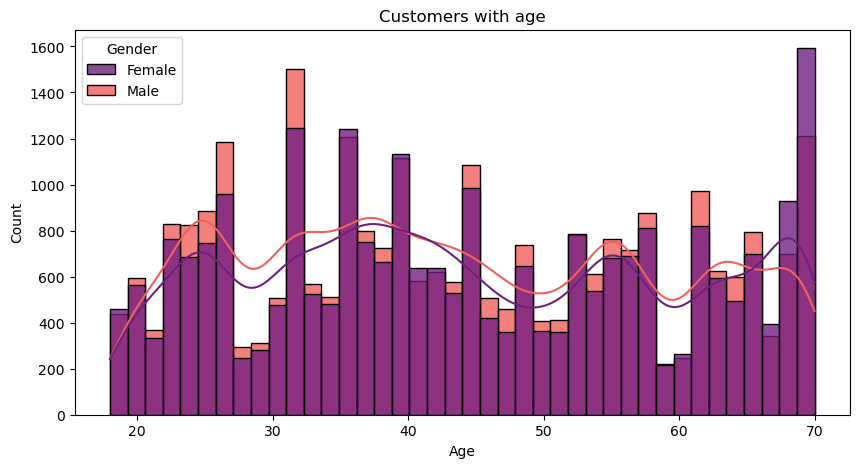

In [12]:

plt.figure(figsize = (10,5))
plt.title('Customers with age')
A=sns.histplot(data = data, x = data['Age'], hue = data['Gender'],palette = 'magma',
            alpha = 0.8, kde = True)
plt.xlabel("Age")
plt.show()

Title & Axes: The graph is titled "Customers with age," with the x-axis representing age and the y-axis representing customer count.

#### Data Representation:

The histogram shows the distribution of customers by age.
The bars are color-coded by gender: purple for females and red for males.
There is a stacked bar format, where male customer counts are placed above female counts.
#### Density Estimation:

Smooth lines (kernel density estimates) overlay the histogram for both genders.
The red line represents the density of male customers, while the purple line represents female customers.
#### Observations:

The distribution appears varied, with some age groups having significantly higher customer counts.
Peaks are noticeable around ages 20–30 and 60–70.
Female customers seem to outnumber males in most age groups.

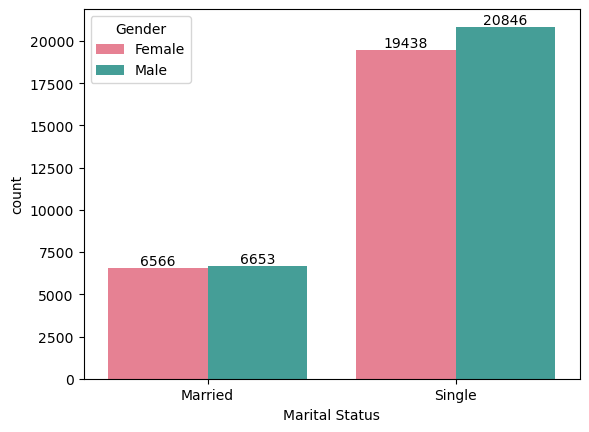

In [13]:
A = sns.countplot(data = data, x = data['Marital Status'],
                  hue = data['Gender'], palette='husl')
for container in A.containers:
    A.bar_label(container, label_type='edge')


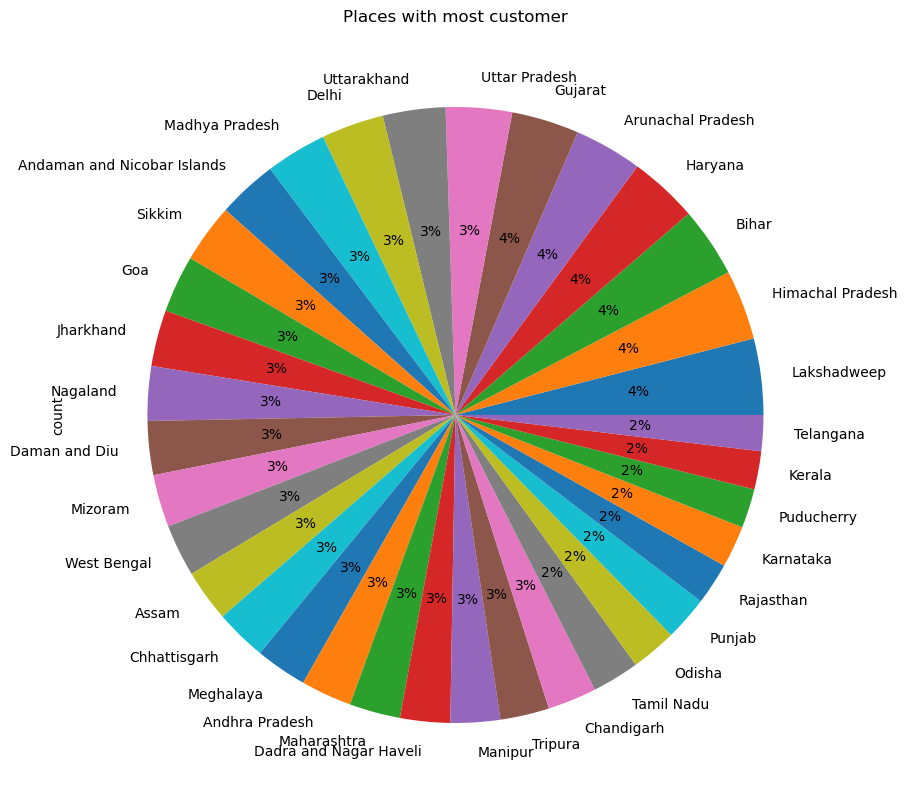

In [14]:
data['Geographic Information'].value_counts().plot.pie(figsize = (10,10), autopct = '%1.0f%%')
plt.title('Places with most customer')
plt.show()

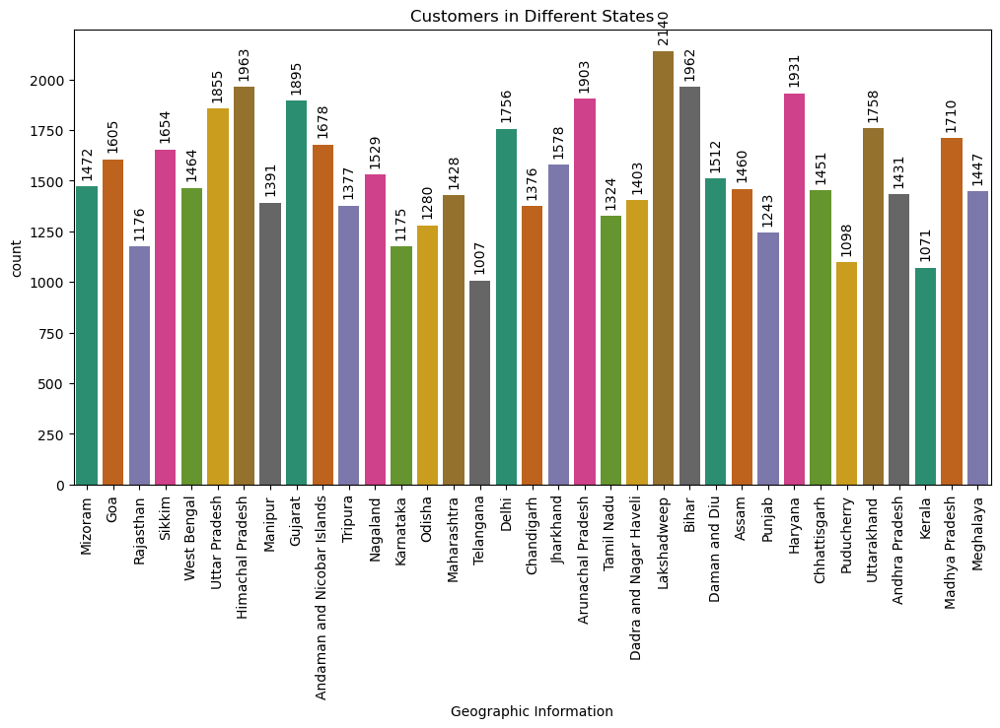

In [15]:
plt.figure(figsize = (12,6))
A = sns.countplot(data, x = data['Geographic Information'],palette="Dark2" )
for container in A.containers:
    A.bar_label(container, rotation=90, padding=5)
plt.xticks(rotation=90)
plt.title("Customers in Different States")
plt.show()


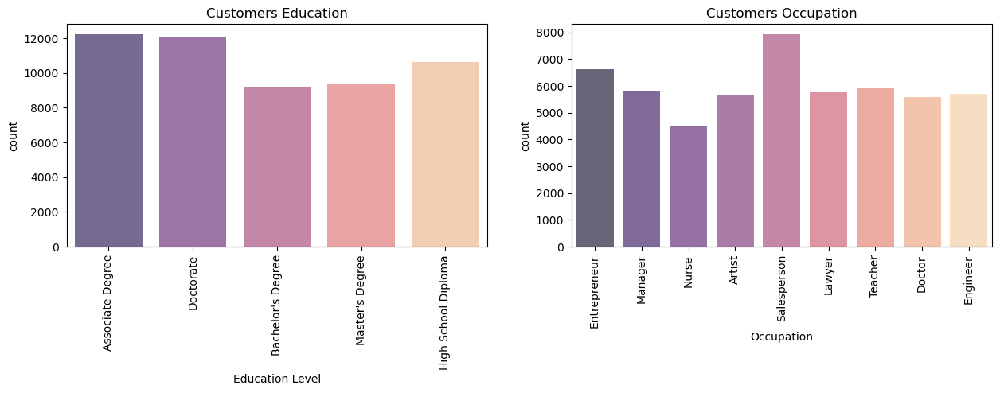

In [16]:
plt.figure(figsize = (15,8))
plt.subplot(2,2,1)
sns.countplot(data = data, x = data['Education Level'], palette= 'magma',alpha = 0.65)
plt.title("Customers Education")
plt.xticks(rotation = 90)

plt.subplot(2, 2, 2)
data['Occupation']
sns.countplot(data=  data,x = data['Occupation'], palette= 'magma', alpha = 0.65)
plt.title('Customers Occupation')
plt.xticks(rotation = 90)
plt.show()

#### 1. Customers Education (Left Chart)
X-axis (Education Level): Different levels of education (e.g., Associate Degree, Doctorate, Bachelor's Degree, etc.).
Y-axis (Count): The number of customers in each education category.
Observations:
Associate Degree and Doctorate have the highest customer counts, both slightly above 12,000.
High School Diploma also has a relatively high count, above 10,000.
Bachelor’s Degree and Master’s Degree have lower customer counts, both around 9,000.
#### 2. Customers Occupation (Right Chart)
X-axis (Occupation): Different job titles (e.g., Entrepreneur, Manager, Salesperson, etc.).
Y-axis (Count): The number of customers in each occupation category.
#### Observations:
Salesperson has the highest customer count, close to 8,000.
Entrepreneur follows with around 6,500 customers.
Nurse has the lowest count, slightly above 4,000.
Other occupations (e.g., Manager, Artist, Lawyer, Teacher, Doctor, Engineer) have similar customer counts, ranging between 5,000 and 6,000.
Key Insights
#### Education:
A large number of customers have an Associate Degree or a Doctorate, suggesting that either vocational/technical education or high academic achievements are common.
Bachelor’s and Master’s Degree holders are comparatively fewer.
#### Occupation:
The high number of Salespersons suggests that many customers work in sales or retail.
Entrepreneurs and Managers also form a significant portion, indicating a business-oriented customer base.
The relatively low count of Nurses might indicate fewer healthcare professionals in the dataset.

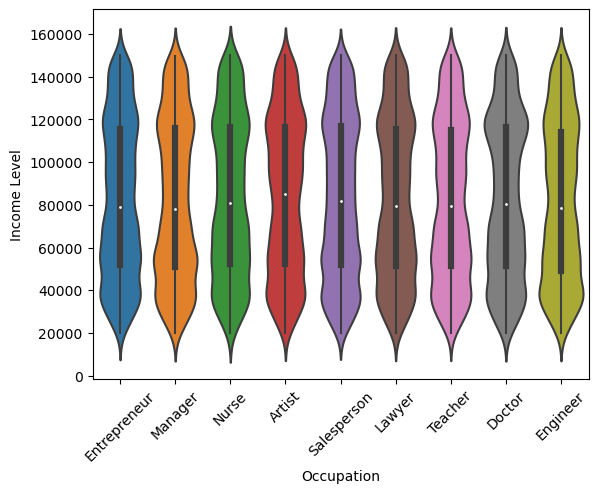

In [17]:
sns.violinplot(x=data["Occupation"], y=data["Income Level"])
plt.xticks(rotation=45)  # Rotate labels for readability
plt.show()

In [94]:
plt.title("customer behaviour data with age and income level")
fig1 = px.scatter_3d(data, x='Age', y = 'Income Level', z = 'Behavioral Data', color='Gender' )
fig1.show()

## Feature Engineering

In [18]:
#Creating two New columns month and year

data['month'] = data['Purchase History'].dt.month
data['year'] = data['Purchase History'].dt.year

In [19]:
#Creating a function to categorise ages
def categorise_age(age):
    if age < 18:
        return "Teen"
    elif age <35:
        return "Youth_Adult"
    elif age <60:
        return "Adult"
    else:
        return "Senior"

In [20]:
data['Age_Category']=data['Age'].apply(categorise_age)

In [21]:
print("Data Type of month is:",data['month'].dtype)
print("Data Type of year is:",data['year'].dtype)
print("-------------------------------\n")
data['Age_Category'] = data['Age_Category'].astype(str)
print("New Data Type of Age_Category is:",data['Age_Category'].dtype)
print("-------------------------------\n")
print("Unique Values in Age_Category columns :",data['Age_Category'].unique())
print("\nUnique Values in year columns :",data['year'].unique())

Data Type of month is: int32
Data Type of year is: int32
-------------------------------

New Data Type of Age_Category is: object
-------------------------------

Unique Values in Age_Category columns : ['Youth_Adult' 'Adult' 'Senior']

Unique Values in year columns : [2018 2021 2020 2022 2023 2019]


In [22]:
data[['Age','Age_Category','month','year']]

,Age,Age_Category,month,year
0,23,Youth_Adult,4,2018
1,26,Youth_Adult,11,2018
2,29,Youth_Adult,6,2021
3,20,Youth_Adult,9,2018
4,25,Youth_Adult,9,2018
...,...,...,...,...
53498,35,Adult,1,2019
53499,61,Senior,5,2021
53500,25,Youth_Adult,11,2018
53501,42,Adult,6,2021


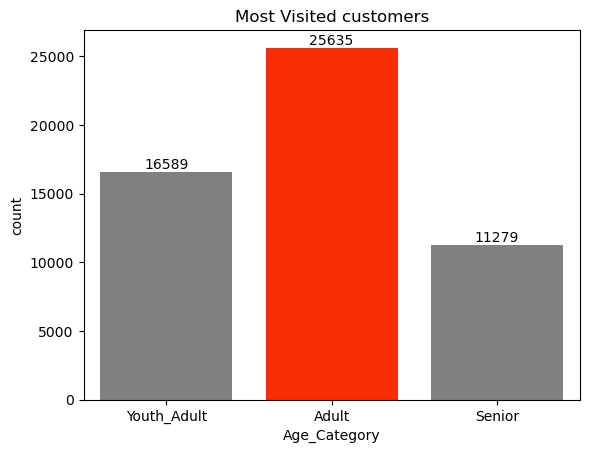

In [23]:
# First Graph

A = sns.countplot(x='Age_Category', data=data, color='gray')

#patches
patches_h=[]
for patch in A.patches:
    reading= patch.get_height()
    patches_h.append(reading)
    
# Adding color to the tallest one
tallest = np.argmax(patches_h)
A.patches[tallest].set_facecolor("#f82d06")

for container in A.containers:
    A.bar_label(container)
plt.title("Most Visited customers")
plt.show()


C:\Users\USER\AppData\Local\Temp\ipykernel_9244\1082168683.py:32: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(data=data, x='month',hue="Age_Category",multiple='layer',


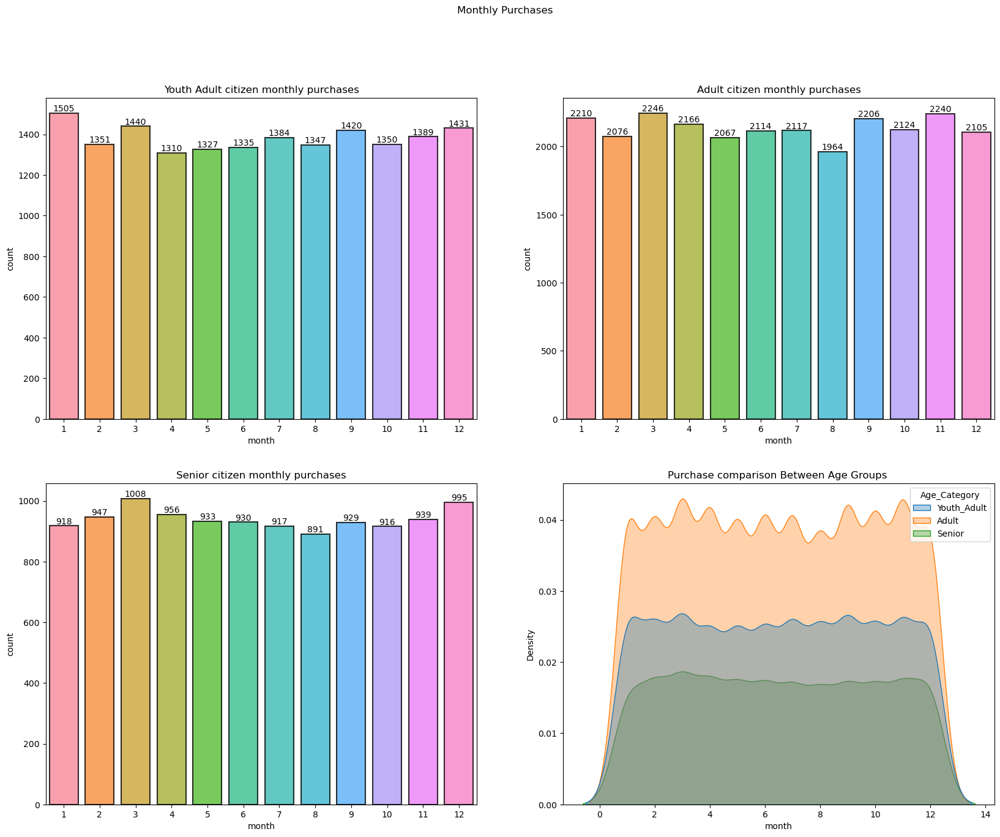

In [24]:
#First Graph
plt.figure(figsize=(20,15))
plt.suptitle("Monthly Purchases")
plt.subplot(2,2,1)
C=sns.countplot(data=data[data['Age_Category']=='Youth_Adult'],x='month', alpha = 0.8,
             edgecolor = 'black', linewidth=1.5, saturation=1.5)
for container in C.containers:
    C.bar_label(container, label_type='edge')
plt.title("Youth Adult citizen monthly purchases")


#Second Graph
plt.subplot(2,2,2)
D=sns.countplot(data=data[data['Age_Category']=='Adult'],x='month', alpha = 0.8,
             edgecolor = 'black', linewidth=1.5, saturation=1.5)
for container in D.containers:
    D.bar_label(container, label_type='edge')
plt.title("Adult citizen monthly purchases")


#Third Graph
plt.subplot(2,2,3)
E=sns.countplot(data=data[data['Age_Category']=='Senior'],x='month', alpha = 0.8,
             edgecolor = 'black', linewidth=1.5, saturation=1.5)
for container in E.containers:
    E.bar_label(container, label_type='edge')
plt.title("Senior citizen monthly purchases")


#Fourth Graph
plt.subplot(2,2,4)
sns.kdeplot(data=data, x='month',hue="Age_Category",multiple='layer',
            alpha = 0.35, shade=True)
plt.title("Purchase comparison Between Age Groups ")
plt.show()

#### 1. Youth Adult Citizen Monthly Purchases (Top-Left)
The monthly purchase count fluctuates between 1310 and 1505.
The highest purchase activity is seen in January (1505).
The lowest is in April (1310).
The variation in purchases is moderate across the months.
#### 2. Adult Citizen Monthly Purchases (Top-Right)
This group consistently shows the highest number of purchases compared to the other age groups.
The monthly purchases range between 1964 and 2246.
The peak purchase month is March (2246).
The lowest purchase month is August (1964).
Purchases show a relatively stable pattern, but there are slight dips in June and August.
#### 3. Senior Citizen Monthly Purchases (Bottom-Left)
The purchase count is the lowest among the three groups, ranging between 891 and 1008.
The highest purchase month is March (1008).
The lowest purchase month is August (891).
The data suggests less variation in purchases over the months, but with an overall lower purchase frequency.
#### 4. Purchase Comparison Between Age Groups (Bottom-Right)
A density plot comparing purchase distributions.
The Adult age category (orange) has the highest purchase density across all months.
Youth Adults (gray) have moderate density, falling between Adults and Seniors.
Seniors (green) have the lowest purchase density.
This confirms that Adults are the most frequent purchasers, followed by Youth Adults, and lastly, Seniors.
#### Key Insights
Adults make the most purchases, followed by Youth Adults, while Seniors purchase the least.
August sees a dip in purchases for all age groups, which could indicate seasonal trends or external factors affecting consumer behavior.
January and March tend to have higher purchases, suggesting possible promotional events or seasonal demand.
Senior citizens have a much lower and stable purchase pattern, whereas Adults show more variation and higher purchasing activity.

C:\Users\USER\AppData\Local\Temp\ipykernel_9244\2811657295.py:32: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(data=data, x='year',hue="Age_Category",multiple='layer',


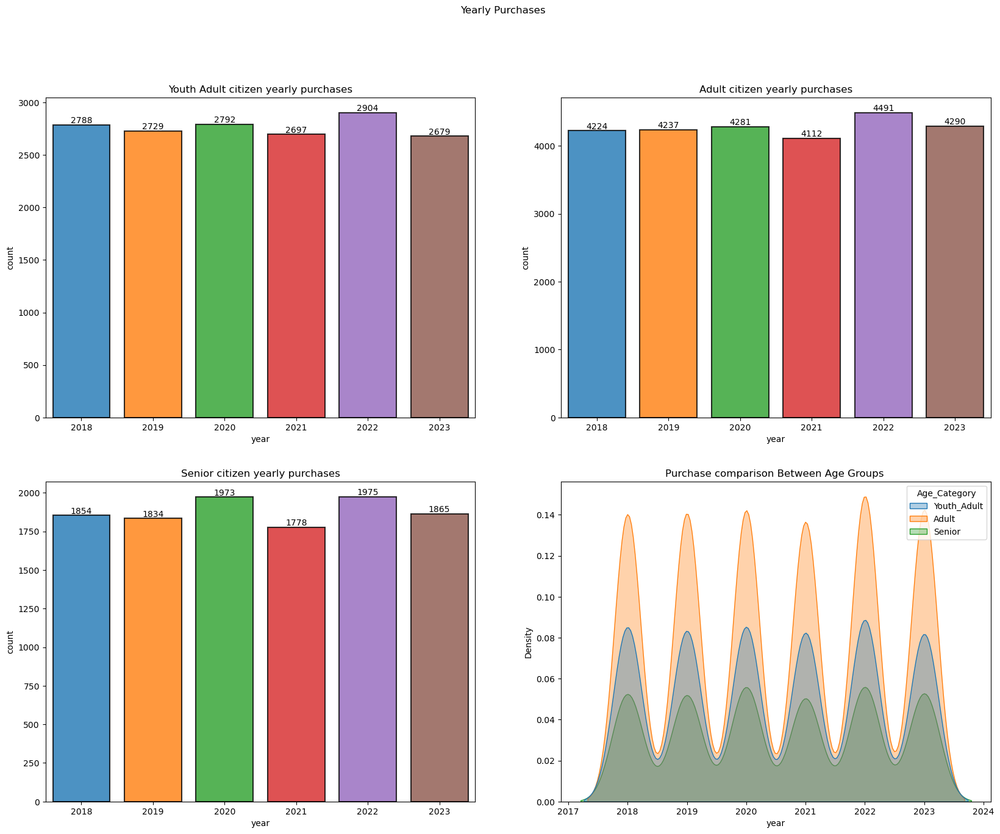

In [25]:
#First Graph
plt.figure(figsize=(20,15))
plt.suptitle("Yearly Purchases")
plt.subplot(2,2,1)
C=sns.countplot(data=data[data['Age_Category']=='Youth_Adult'],x='year', alpha = 0.8,
             edgecolor = 'black', linewidth=1.5, saturation=1.5)
for container in C.containers:
    C.bar_label(container, label_type='edge')
plt.title("Youth Adult citizen yearly purchases")


#Second Graph
plt.subplot(2,2,2)
D=sns.countplot(data=data[data['Age_Category']=='Adult'],x='year', alpha = 0.8,
             edgecolor = 'black', linewidth=1.5, saturation=1.5)
for container in D.containers:
    D.bar_label(container, label_type='edge')
plt.title("Adult citizen yearly purchases")


#Third Graph
plt.subplot(2,2,3)
E=sns.countplot(data=data[data['Age_Category']=='Senior'],x='year', alpha = 0.8,
             edgecolor = 'black', linewidth=1.5, saturation=1.5)
for container in E.containers:
    E.bar_label(container, label_type='edge')
plt.title("Senior citizen yearly purchases")


#Fourth Graph
plt.subplot(2,2,4)
sns.kdeplot(data=data, x='year',hue="Age_Category",multiple='layer',
            alpha = 0.35, shade=True)
plt.title("Purchase comparison Between Age Groups ")
plt.show()

#### 1. Youth Adult Citizen Yearly Purchases (Top-Left)
The yearly purchase count fluctuates between 2679 and 2904.
The highest number of purchases was in 2022 (2904).
The lowest purchases were in 2021 (2697).
Purchases remained relatively stable across the years, with small variations.
#### 2. Adult Citizen Yearly Purchases (Top-Right)
Adults consistently made the highest purchases among all groups.
The purchase count ranges between 4112 and 4491.
The highest purchases were in 2022 (4491).
The lowest purchases were in 2021 (4112).
Purchases slightly declined in 2023 (4290) compared to 2022 but remained higher than other years.
#### 3. Senior Citizen Yearly Purchases (Bottom-Left)
Senior citizens have the lowest purchase count among all groups.
The purchase count ranges between 1778 and 1975.
The highest purchases were in 2022 (1975).
The lowest purchases were in 2021 (1778).
Purchases were relatively stable, with a slight decline in 2019 and 2021, followed by an increase.
#### 4. Purchase Comparison Between Age Groups (Bottom-Right)
A density plot comparing yearly purchase distributions.
Adults (orange) show the highest density across all years, indicating they make the most purchases.
Youth Adults (gray) have moderate density, showing stable but lower purchase activity compared to adults.
Seniors (green) have the lowest purchase density.
Peaks are visible at each year, showing periodic purchase trends.
#### Key Insights
Adults consistently make the highest number of purchases, followed by Youth Adults, while Senior Citizens have the lowest purchase count.
2021 saw a decline in purchases across all groups, possibly due to external factors such as economic conditions or global events.
Purchases peaked in 2022 for all age groups, indicating a strong consumer market during that year.
Senior citizens have a lower and more stable purchase trend, while Adults show consistent growth with minor fluctuations.

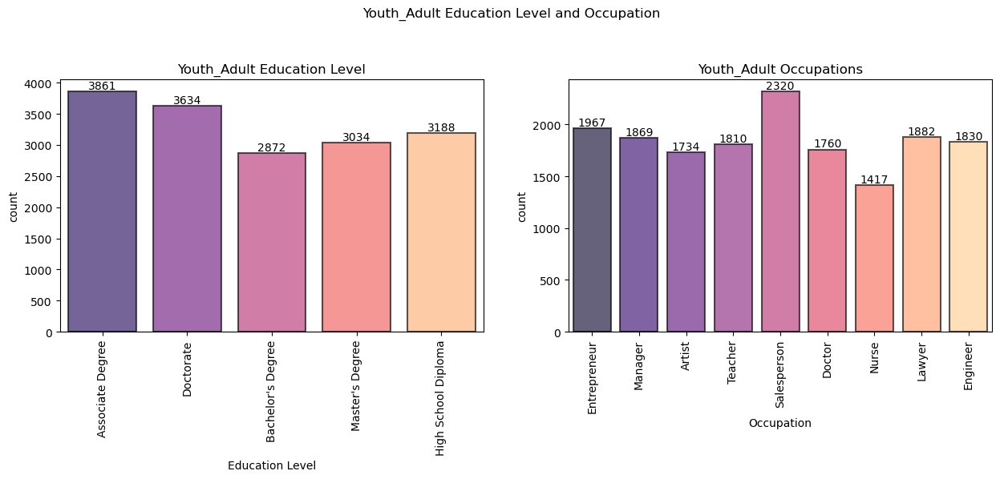

In [26]:
plt.figure(figsize=(15,9))
plt.suptitle("Youth_Adult Education Level and Occupation")

#First graph
plt.subplot(2,2,1)
Q=sns.countplot(data=data[data['Age_Category']=='Youth_Adult'],x='Education Level', alpha = 0.65,
             edgecolor = 'black', linewidth=1.5, saturation=1.5, palette='magma')
for container in Q.containers:
    Q.bar_label(container, label_type='edge')
plt.xticks(rotation = 90)
plt.title("Youth_Adult Education Level")

#Second graph
plt.subplot(2,2,2)
Y=sns.countplot(data=data[data['Age_Category']=='Youth_Adult'],x='Occupation', alpha = 0.65,
             edgecolor = 'black', linewidth=1.5, saturation=1.5, palette='magma')
for container in Y.containers:
    Y.bar_label(container, label_type='edge')
plt.xticks(rotation = 90)
plt.title("Youth_Adult Occupations")

plt.show()

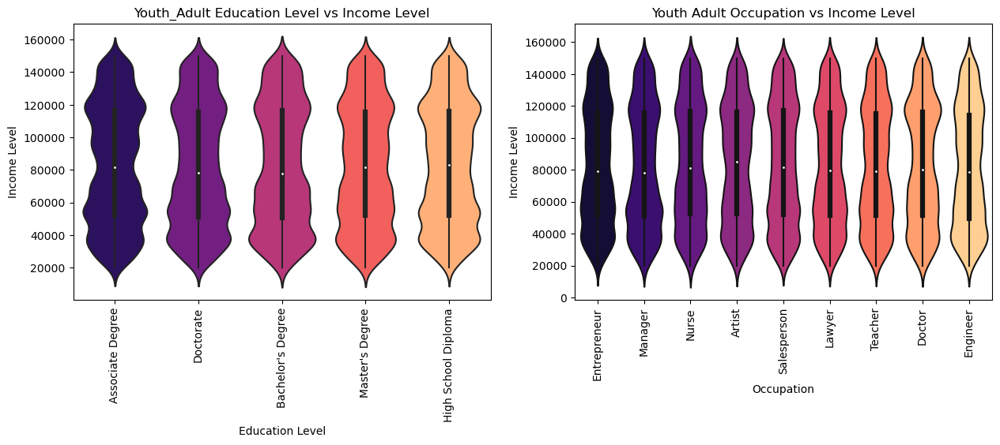

In [27]:
plt.figure(figsize=(15,10))

#First graph
plt.subplot(2,2,1)
Z=sns.violinplot(data=data[data['Age_Category']=='Youth_Adult'],x=data["Education Level"],
                y=data["Income Level"], alpha = 0.5,
             edgecolor = 'black', linewidth=1.5, saturation=1.5, palette='magma')
for container in Z.containers:
    Z.bar_label(container, label_type='edge')
plt.xticks(rotation = 90)
plt.title("Youth_Adult Education Level vs Income Level")

#Second graph
plt.subplot(2,2,2)
IA=sns.violinplot(data=data[data['Age_Category']=='Youth_Adult'],x=data["Occupation"],
                 y=data["Income Level"], alpha = 0.5,
             edgecolor = 'black', linewidth=1.5, saturation=1.5, palette='magma')
for container in IA.containers:
    IA.bar_label(container, label_type='edge')
plt.xticks(rotation = 90)
plt.title("Youth Adult Occupation vs Income Level")

plt.show()

#### 1. Education Level Distribution (Top-Left Graph)
The most common education level among youth adults is an Associate Degree (3861 individuals), followed by Doctorate (3634 individuals).
The least common education level is a Bachelor’s Degree (2872 individuals).
There is a fairly balanced distribution, but higher education levels (Doctorate, Master’s Degree, and Associate Degrees) seem to dominate.
#### 2. Occupation Distribution (Top-Right Graph)
The most common occupation among youth adults is Salesperson (2320 individuals), followed by Entrepreneur (1967 individuals).
Nurses (1417 individuals) are the least common occupation in the dataset.
Other professions like Managers, Engineers, and Lawyers have moderate representation.
#### 3. Education Level vs. Income (Bottom-Left Violin Plot)
The income distribution is wide for all education levels, suggesting that individuals with the same level of education can have significantly different earnings.
Doctorate and Master's Degree holders appear to have a slightly higher income range.
High School Diploma holders have lower earning potential, but there are still individuals with high incomes within this group.
#### 4. Occupation vs. Income (Bottom-Right Violin Plot)
The income range varies significantly across different occupations.
Some occupations like Entrepreneurs, Engineers, and Managers have higher income peaks.
Salespersons and Nurses generally have lower income distributions compared to other occupations.
The distribution suggests that certain jobs have a broader income disparity, indicating possible differences in experience levels, industries, or career progressions.
#### Key Takeaways
Education Levels: Associate Degrees and Doctorates are the most common among youth adults.
Popular Occupations: Salespersons, Entrepreneurs, and Managers dominate the workforce.


In [28]:
nu_df = data.select_dtypes("number")

In [29]:
nu_df.skew()

Customer ID       -0.186398
Age                0.116046
Income Level       0.109402
Coverage Amount    0.165374
Premium Amount    -0.274183
month              0.005067
year              -0.012785
dtype: float64

#### Encoding 

In [30]:
cat = data.select_dtypes("object")
cat

,Gender,Marital Status,Education Level,Geographic Information,Occupation,Behavioral Data,Interactions with Customer Service,Insurance Products Owned,Policy Type,Customer Preferences,Preferred Communication Channel,Preferred Contact Time,Preferred Language,Segmentation Group,Age_Category
0,Female,Married,Associate Degree,Mizoram,Entrepreneur,policy5,Phone,policy2,Group,Email,In-Person Meeting,Afternoon,English,Segment5,Youth_Adult
1,Male,Single,Doctorate,Goa,Manager,policy5,Chat,policy1,Group,Mail,In-Person Meeting,Morning,French,Segment5,Youth_Adult
2,Female,Single,Associate Degree,Rajasthan,Entrepreneur,policy5,Email,policy3,Group,Email,Mail,Evening,German,Segment3,Youth_Adult
3,Male,Single,Bachelor's Degree,Sikkim,Entrepreneur,policy5,Chat,policy2,Family,Text,In-Person Meeting,Anytime,French,Segment3,Youth_Adult
4,Female,Single,Bachelor's Degree,West Bengal,Manager,policy1,Chat,policy4,Family,Email,Text,Weekends,English,Segment2,Youth_Adult
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
53498,Female,Single,Associate Degree,Andaman and Nicobar Islands,Salesperson,policy3,Mobile App,policy1,Family,In-Person Meeting,Phone,Afternoon,German,Segment5,Adult
53499,Male,Single,Doctorate,Himachal Pradesh,Entrepreneur,policy5,Mobile App,policy4,Group,Text,Mail,Afternoon,German,Segment1,Senior
53500,Male,Single,Doctorate,Assam,Teacher,policy2,In-Person,policy1,Individual,Text,Text,Weekends,French,Segment4,Youth_Adult
53501,Male,Married,Doctorate,Andhra Pradesh,Artist,policy4,In-Person,policy1,Business,Mail,Phone,Morning,French,Segment5,Adult


In [31]:
cat1 = cat.drop(columns = ['Interactions with Customer Service','Customer Preferences','Preferred Communication Channel','Preferred Contact Time','Preferred Language','Segmentation Group',
                          'Age_Category'])
cat1

,Gender,Marital Status,Education Level,Geographic Information,Occupation,Behavioral Data,Insurance Products Owned,Policy Type
0,Female,Married,Associate Degree,Mizoram,Entrepreneur,policy5,policy2,Group
1,Male,Single,Doctorate,Goa,Manager,policy5,policy1,Group
2,Female,Single,Associate Degree,Rajasthan,Entrepreneur,policy5,policy3,Group
3,Male,Single,Bachelor's Degree,Sikkim,Entrepreneur,policy5,policy2,Family
4,Female,Single,Bachelor's Degree,West Bengal,Manager,policy1,policy4,Family
...,...,...,...,...,...,...,...,...
53498,Female,Single,Associate Degree,Andaman and Nicobar Islands,Salesperson,policy3,policy1,Family
53499,Male,Single,Doctorate,Himachal Pradesh,Entrepreneur,policy5,policy4,Group
53500,Male,Single,Doctorate,Assam,Teacher,policy2,policy1,Individual
53501,Male,Married,Doctorate,Andhra Pradesh,Artist,policy4,policy1,Business


#### OneHotEncoder

In [32]:
one = OneHotEncoder()
dm = one.fit_transform(cat1)

In [33]:
encode_cat = pd.DataFrame(dm.toarray(), columns = one.get_feature_names_out())
encode_cat

,Gender_Female,Gender_Male,Marital Status_Married,Marital Status_Single,Education Level_Associate Degree,Education Level_Bachelor's Degree,Education Level_Doctorate,Education Level_High School Diploma,Education Level_Master's Degree,Geographic Information_Andaman and Nicobar Islands,...,Behavioral Data_policy5,Insurance Products Owned_policy1,Insurance Products Owned_policy2,Insurance Products Owned_policy3,Insurance Products Owned_policy4,Insurance Products Owned_policy5,Policy Type_Business,Policy Type_Family,Policy Type_Group,Policy Type_Individual
0,1.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,...,1.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0
1,0.0,1.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,...,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0
2,1.0,0.0,0.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,...,1.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0
3,0.0,1.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,...,1.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0
4,1.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
53498,1.0,0.0,0.0,1.0,1.0,0.0,0.0,0.0,0.0,1.0,...,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0
53499,0.0,1.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,...,1.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0
53500,0.0,1.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,...,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0
53501,0.0,1.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,...,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0


In [34]:
encode_cat=encode_cat.drop(columns=['Gender_Female','Marital Status_Single',])
encode_cat

,Gender_Male,Marital Status_Married,Education Level_Associate Degree,Education Level_Bachelor's Degree,Education Level_Doctorate,Education Level_High School Diploma,Education Level_Master's Degree,Geographic Information_Andaman and Nicobar Islands,Geographic Information_Andhra Pradesh,Geographic Information_Arunachal Pradesh,...,Behavioral Data_policy5,Insurance Products Owned_policy1,Insurance Products Owned_policy2,Insurance Products Owned_policy3,Insurance Products Owned_policy4,Insurance Products Owned_policy5,Policy Type_Business,Policy Type_Family,Policy Type_Group,Policy Type_Individual
0,0.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,1.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0
1,1.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,...,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0
2,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,1.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0
3,1.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,...,1.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0
4,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
53498,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,...,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0
53499,1.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,...,1.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0
53500,1.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,...,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0
53501,1.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,...,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0


In [35]:
nu_df=nu_df.drop(columns = ['Customer ID'])# Removing Customer id column

In [36]:
#Standardisation
st = StandardScaler()
num = st.fit_transform(nu_df)
num_df = pd.DataFrame(num, columns=st.get_feature_names_out())
num_df

,Age,Income Level,Coverage Amount,Premium Amount,month,year
0,-1.401980,-0.333617,-0.469361,-0.213640,-0.715557,-1.470481
1,-1.203033,-0.780348,1.071729,-0.822588,1.297220,-1.470481
2,-1.004085,-0.241996,1.048219,1.080474,-0.140478,0.286929
3,-1.600928,-0.528975,1.099966,1.025256,0.722141,-1.470481
4,-1.269349,-1.199821,-0.469722,-1.359210,0.722141,-1.470481
...,...,...,...,...,...,...
53498,-0.606190,1.039043,0.349550,1.073475,-1.578176,-0.884678
53499,1.118023,1.078851,0.540800,-1.352211,-0.428018,0.286929
53500,-1.269349,-0.914315,0.515926,1.075808,1.297220,-1.470481
53501,-0.141979,-0.449304,0.885997,1.134136,-0.140478,0.286929


In [37]:
#Combining Both columns 

df = num_df.join(encode_cat)
df

,Age,Income Level,Coverage Amount,Premium Amount,month,year,Gender_Male,Marital Status_Married,Education Level_Associate Degree,Education Level_Bachelor's Degree,...,Behavioral Data_policy5,Insurance Products Owned_policy1,Insurance Products Owned_policy2,Insurance Products Owned_policy3,Insurance Products Owned_policy4,Insurance Products Owned_policy5,Policy Type_Business,Policy Type_Family,Policy Type_Group,Policy Type_Individual
0,-1.401980,-0.333617,-0.469361,-0.213640,-0.715557,-1.470481,0.0,1.0,1.0,0.0,...,1.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0
1,-1.203033,-0.780348,1.071729,-0.822588,1.297220,-1.470481,1.0,0.0,0.0,0.0,...,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0
2,-1.004085,-0.241996,1.048219,1.080474,-0.140478,0.286929,0.0,0.0,1.0,0.0,...,1.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0
3,-1.600928,-0.528975,1.099966,1.025256,0.722141,-1.470481,1.0,0.0,0.0,1.0,...,1.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0
4,-1.269349,-1.199821,-0.469722,-1.359210,0.722141,-1.470481,0.0,0.0,0.0,1.0,...,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
53498,-0.606190,1.039043,0.349550,1.073475,-1.578176,-0.884678,0.0,0.0,1.0,0.0,...,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0
53499,1.118023,1.078851,0.540800,-1.352211,-0.428018,0.286929,1.0,0.0,0.0,0.0,...,1.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0
53500,-1.269349,-0.914315,0.515926,1.075808,1.297220,-1.470481,1.0,0.0,0.0,0.0,...,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0
53501,-0.141979,-0.449304,0.885997,1.134136,-0.140478,0.286929,1.0,1.0,0.0,0.0,...,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0


In [38]:
#Normalization
minmax = MinMaxScaler()
x_scaled = minmax.fit_transform(df)
new_df = pd.DataFrame(x_scaled, columns=minmax.get_feature_names_out())

In [39]:
new_df

,Age,Income Level,Coverage Amount,Premium Amount,month,year,Gender_Male,Marital Status_Married,Education Level_Associate Degree,Education Level_Bachelor's Degree,...,Behavioral Data_policy5,Insurance Products Owned_policy1,Insurance Products Owned_policy2,Insurance Products Owned_policy3,Insurance Products Owned_policy4,Insurance Products Owned_policy5,Policy Type_Business,Policy Type_Family,Policy Type_Group,Policy Type_Individual
0,0.096154,0.388775,0.333266,0.499778,0.272727,0.0,0.0,1.0,1.0,0.0,...,1.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0
1,0.153846,0.262827,0.768669,0.325778,0.909091,0.0,1.0,0.0,0.0,0.0,...,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0
2,0.211538,0.414606,0.762027,0.869556,0.454545,0.6,0.0,0.0,1.0,0.0,...,1.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0
3,0.038462,0.333697,0.776647,0.853778,0.727273,0.0,1.0,0.0,0.0,1.0,...,1.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0
4,0.134615,0.144564,0.333164,0.172444,0.727273,0.0,0.0,0.0,0.0,1.0,...,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
53498,0.326923,0.775773,0.564632,0.867556,0.000000,0.2,0.0,0.0,1.0,0.0,...,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0
53499,0.826923,0.786997,0.618666,0.174444,0.363636,0.6,1.0,0.0,0.0,0.0,...,1.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0
53500,0.134615,0.225057,0.611639,0.868222,0.909091,0.0,1.0,0.0,0.0,0.0,...,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0
53501,0.461538,0.356159,0.716194,0.884889,0.454545,0.6,1.0,1.0,0.0,0.0,...,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0


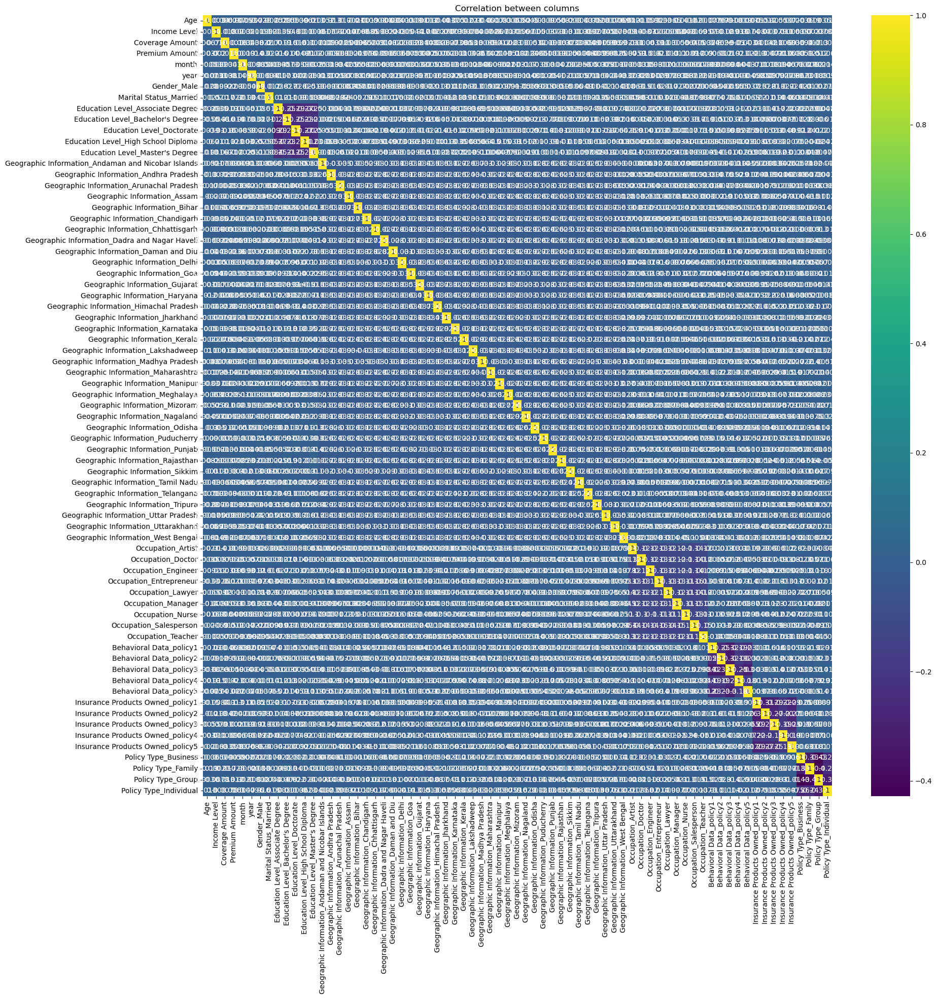

In [40]:
plt.figure(figsize = (20,20))
corr = new_df.corr()
plt.title("Correlation between columns")
sns.heatmap(corr, annot = True, linecolor='white', cmap = 'viridis')
plt.show()

## Dimentionality Reduction

In [41]:
# Apply PCA to reduce components
pca = PCA()
x_pca = pca.fit_transform(x_scaled)

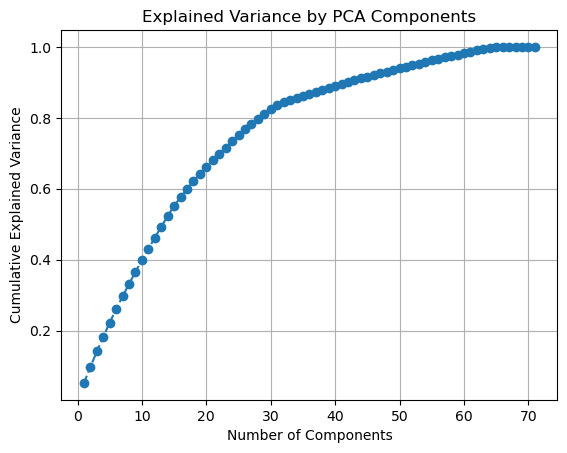

In [42]:
plt.plot(range(1, len(pca.explained_variance_ratio_) + 1), np.cumsum(pca.explained_variance_ratio_), marker='o', linestyle='--')
plt.xlabel('Number of Components')
plt.ylabel('Cumulative Explained Variance')
plt.title('Explained Variance by PCA Components')
plt.grid()
plt.show()

In [43]:
# Find the minimum number of components needed for 95% variance
n_components_95 = np.argmax(np.cumsum(pca.explained_variance_ratio_) >= 0.95) + 1
print(f"Optimal number of components: {n_components_95}")


Optimal number of components: 53


In [64]:
#This transforms your dataset into a lower-dimensional
#version while keeping most of the information.
pca = PCA(n_components=53)
X_pca = pca.fit_transform(x_scaled)

### KMeans Clustering Method

In [65]:
kmeans = KMeans(n_clusters=3, random_state=42)
clusters = kmeans.fit_predict(X_pca)

C:\Users\USER\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


#### Evaluate Clustering Performance 

In [66]:
# Clustering before PCA
kmeans_original = KMeans(n_clusters=3, random_state=42).fit(x_scaled)
score_original = silhouette_score(x_scaled, kmeans_original.labels_)

# Clustering after PCA
scor_pca = silhouette_score(X_pca, clusters)

print(f"silhouette_scorebefore PCA :{score_original:.4f}")
print(f"silhouette_scorebefore PCA :{scor_pca:.4f}")

C:\Users\USER\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


silhouette_scorebefore PCA :0.0679
silhouette_scorebefore PCA :0.0716


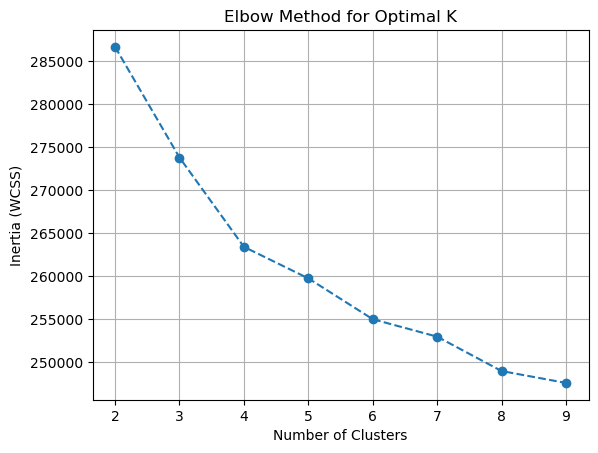

In [67]:

# Try different cluster numbers
inertia = []
K = range(2, 10)  # Try clusters from 2 to 10

for k in K:
    kmeans = KMeans(n_clusters=k, random_state=42, n_init=10)
    kmeans.fit(X_pca)  # Use PCA-reduced data
    inertia.append(kmeans.inertia_)  # Save inertia value

# Plot Elbow Method
plt.plot(K, inertia, marker='o', linestyle='--')
plt.xlabel('Number of Clusters')
plt.ylabel('Inertia (WCSS)')
plt.title('Elbow Method for Optimal K')
plt.grid()
plt.show()


X Axis : Represent number of clusters

Y axis : Measures the total squared distance between data points and their assigned cluster centers.

The curve indicates that, the inertia decreases as the number of clusters increases

the elbow Point is where the decreases slow down here it showing down when the cluster is 4 good to pick

In [71]:
#Test Silhouette Scores for Different k

for k in range(2, 10):
    kmeans = KMeans(n_clusters=k, random_state=42, n_init=10).fit(X_pca)
    score = silhouette_score(X_pca, kmeans.labels_)
    print(f"Silhouette Score for {k} clusters: {score:.4f}")


Silhouette Score for 2 clusters: 0.0512
Silhouette Score for 3 clusters: 0.0716
Silhouette Score for 4 clusters: 0.0883
Silhouette Score for 5 clusters: 0.0630
Silhouette Score for 6 clusters: 0.0536
Silhouette Score for 7 clusters: 0.0494
Silhouette Score for 8 clusters: 0.0557
Silhouette Score for 9 clusters: 0.0491


In [72]:
kmeans = KMeans(n_clusters=4, random_state=42)
clusters = kmeans.fit_predict(X_pca)

C:\Users\USER\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


In [73]:
# Clustering before PCA
kmeans_original = KMeans(n_clusters=4, random_state=42).fit(x_scaled)
score_original = silhouette_score(x_scaled, kmeans_original.labels_)

# Clustering after PCA
scor_pca = silhouette_score(X_pca, clusters)


C:\Users\USER\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


#### LabelEncoder

In [51]:
label = LabelEncoder()

In [52]:
cat

,Gender,Marital Status,Education Level,Geographic Information,Occupation,Behavioral Data,Interactions with Customer Service,Insurance Products Owned,Policy Type,Customer Preferences,Preferred Communication Channel,Preferred Contact Time,Preferred Language,Segmentation Group,Age_Category
0,Female,Married,Associate Degree,Mizoram,Entrepreneur,policy5,Phone,policy2,Group,Email,In-Person Meeting,Afternoon,English,Segment5,Youth_Adult
1,Male,Single,Doctorate,Goa,Manager,policy5,Chat,policy1,Group,Mail,In-Person Meeting,Morning,French,Segment5,Youth_Adult
2,Female,Single,Associate Degree,Rajasthan,Entrepreneur,policy5,Email,policy3,Group,Email,Mail,Evening,German,Segment3,Youth_Adult
3,Male,Single,Bachelor's Degree,Sikkim,Entrepreneur,policy5,Chat,policy2,Family,Text,In-Person Meeting,Anytime,French,Segment3,Youth_Adult
4,Female,Single,Bachelor's Degree,West Bengal,Manager,policy1,Chat,policy4,Family,Email,Text,Weekends,English,Segment2,Youth_Adult
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
53498,Female,Single,Associate Degree,Andaman and Nicobar Islands,Salesperson,policy3,Mobile App,policy1,Family,In-Person Meeting,Phone,Afternoon,German,Segment5,Adult
53499,Male,Single,Doctorate,Himachal Pradesh,Entrepreneur,policy5,Mobile App,policy4,Group,Text,Mail,Afternoon,German,Segment1,Senior
53500,Male,Single,Doctorate,Assam,Teacher,policy2,In-Person,policy1,Individual,Text,Text,Weekends,French,Segment4,Youth_Adult
53501,Male,Married,Doctorate,Andhra Pradesh,Artist,policy4,In-Person,policy1,Business,Mail,Phone,Morning,French,Segment5,Adult


In [53]:
cat2 = cat.drop(columns = ['Interactions with Customer Service','Customer Preferences','Preferred Communication Channel','Preferred Contact Time','Preferred Language','Segmentation Group',
                          'Age_Category'])
cat2

,Gender,Marital Status,Education Level,Geographic Information,Occupation,Behavioral Data,Insurance Products Owned,Policy Type
0,Female,Married,Associate Degree,Mizoram,Entrepreneur,policy5,policy2,Group
1,Male,Single,Doctorate,Goa,Manager,policy5,policy1,Group
2,Female,Single,Associate Degree,Rajasthan,Entrepreneur,policy5,policy3,Group
3,Male,Single,Bachelor's Degree,Sikkim,Entrepreneur,policy5,policy2,Family
4,Female,Single,Bachelor's Degree,West Bengal,Manager,policy1,policy4,Family
...,...,...,...,...,...,...,...,...
53498,Female,Single,Associate Degree,Andaman and Nicobar Islands,Salesperson,policy3,policy1,Family
53499,Male,Single,Doctorate,Himachal Pradesh,Entrepreneur,policy5,policy4,Group
53500,Male,Single,Doctorate,Assam,Teacher,policy2,policy1,Individual
53501,Male,Married,Doctorate,Andhra Pradesh,Artist,policy4,policy1,Business


In [54]:
label_encoded_df = cat2.apply(lambda col: label.fit_transform(col))

In [55]:
label_encoded_df 

,Gender,Marital Status,Education Level,Geographic Information,Occupation,Behavioral Data,Insurance Products Owned,Policy Type
0,0,0,0,22,3,4,1,2
1,1,1,2,10,5,4,0,2
2,0,1,0,27,3,4,2,2
3,1,1,1,28,3,4,1,1
4,0,1,1,34,5,0,3,1
...,...,...,...,...,...,...,...,...
53498,0,1,0,0,7,2,0,1
53499,1,1,2,13,3,4,3,2
53500,1,1,2,3,8,1,0,3
53501,1,0,2,1,0,3,0,0


In [56]:
stand_cat2 = st.fit_transform(label_encoded_df)
new_cate = pd.DataFrame(stand_cat2, columns = st.get_feature_names_out())

In [57]:
new_cate

,Gender,Marital Status,Education Level,Geographic Information,Occupation,Behavioral Data,Insurance Products Owned,Policy Type
0,-1.028344,-1.745689,-1.365141,0.547943,-0.420389,1.571332,-0.552061,0.563639
1,0.972437,0.572840,0.057168,-0.637324,0.351183,1.571332,-1.241050,0.563639
2,-1.028344,0.572840,-1.365141,1.041804,-0.420389,1.571332,0.136927,0.563639
3,0.972437,0.572840,-0.653987,1.140576,-0.420389,1.571332,-0.552061,-0.391947
4,-1.028344,0.572840,-0.653987,1.733210,0.351183,-1.391104,0.825916,-0.391947
...,...,...,...,...,...,...,...,...
53498,-1.028344,0.572840,-1.365141,-1.625046,1.122755,0.090114,-1.241050,-0.391947
53499,0.972437,0.572840,0.057168,-0.341007,-0.420389,1.571332,0.825916,0.563639
53500,0.972437,0.572840,0.057168,-1.328729,1.508541,-0.650495,-1.241050,1.519226
53501,0.972437,-1.745689,0.057168,-1.526274,-1.577748,0.830723,-1.241050,-1.347534


In [58]:
df2 = num_df.join(new_cate)
df2

,Age,Income Level,Coverage Amount,Premium Amount,month,year,Gender,Marital Status,Education Level,Geographic Information,Occupation,Behavioral Data,Insurance Products Owned,Policy Type
0,-1.401980,-0.333617,-0.469361,-0.213640,-0.715557,-1.470481,-1.028344,-1.745689,-1.365141,0.547943,-0.420389,1.571332,-0.552061,0.563639
1,-1.203033,-0.780348,1.071729,-0.822588,1.297220,-1.470481,0.972437,0.572840,0.057168,-0.637324,0.351183,1.571332,-1.241050,0.563639
2,-1.004085,-0.241996,1.048219,1.080474,-0.140478,0.286929,-1.028344,0.572840,-1.365141,1.041804,-0.420389,1.571332,0.136927,0.563639
3,-1.600928,-0.528975,1.099966,1.025256,0.722141,-1.470481,0.972437,0.572840,-0.653987,1.140576,-0.420389,1.571332,-0.552061,-0.391947
4,-1.269349,-1.199821,-0.469722,-1.359210,0.722141,-1.470481,-1.028344,0.572840,-0.653987,1.733210,0.351183,-1.391104,0.825916,-0.391947
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
53498,-0.606190,1.039043,0.349550,1.073475,-1.578176,-0.884678,-1.028344,0.572840,-1.365141,-1.625046,1.122755,0.090114,-1.241050,-0.391947
53499,1.118023,1.078851,0.540800,-1.352211,-0.428018,0.286929,0.972437,0.572840,0.057168,-0.341007,-0.420389,1.571332,0.825916,0.563639
53500,-1.269349,-0.914315,0.515926,1.075808,1.297220,-1.470481,0.972437,0.572840,0.057168,-1.328729,1.508541,-0.650495,-1.241050,1.519226
53501,-0.141979,-0.449304,0.885997,1.134136,-0.140478,0.286929,0.972437,-1.745689,0.057168,-1.526274,-1.577748,0.830723,-1.241050,-1.347534


In [59]:
# Normalisation
x_scaled2 = minmax.fit_transform(df2)
pd.DataFrame(x_scaled2, columns = minmax.get_feature_names_out())

,Age,Income Level,Coverage Amount,Premium Amount,month,year,Gender,Marital Status,Education Level,Geographic Information,Occupation,Behavioral Data,Insurance Products Owned,Policy Type
0,0.096154,0.388775,0.333266,0.499778,0.272727,0.0,0.0,0.0,0.00,0.647059,0.375,1.00,0.25,0.666667
1,0.153846,0.262827,0.768669,0.325778,0.909091,0.0,1.0,1.0,0.50,0.294118,0.625,1.00,0.00,0.666667
2,0.211538,0.414606,0.762027,0.869556,0.454545,0.6,0.0,1.0,0.00,0.794118,0.375,1.00,0.50,0.666667
3,0.038462,0.333697,0.776647,0.853778,0.727273,0.0,1.0,1.0,0.25,0.823529,0.375,1.00,0.25,0.333333
4,0.134615,0.144564,0.333164,0.172444,0.727273,0.0,0.0,1.0,0.25,1.000000,0.625,0.00,0.75,0.333333
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
53498,0.326923,0.775773,0.564632,0.867556,0.000000,0.2,0.0,1.0,0.00,0.000000,0.875,0.50,0.00,0.333333
53499,0.826923,0.786997,0.618666,0.174444,0.363636,0.6,1.0,1.0,0.50,0.382353,0.375,1.00,0.75,0.666667
53500,0.134615,0.225057,0.611639,0.868222,0.909091,0.0,1.0,1.0,0.50,0.088235,1.000,0.25,0.00,1.000000
53501,0.461538,0.356159,0.716194,0.884889,0.454545,0.6,1.0,0.0,0.50,0.029412,0.000,0.75,0.00,0.000000


In [75]:
pca = PCA(n_components=.95)  # MLE chooses the optimal number of components
X_pca2 = pca.fit_transform(x_scaled2)

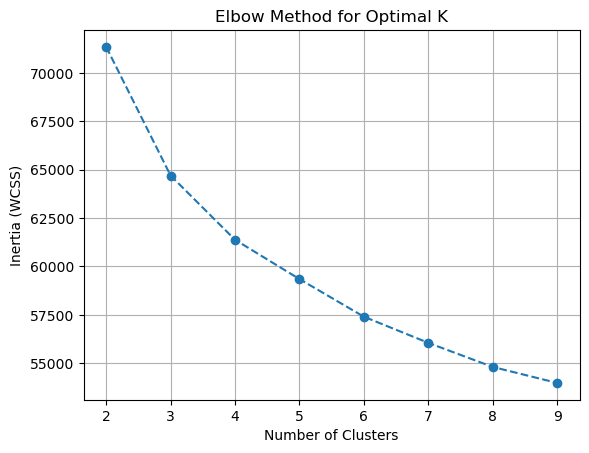

In [76]:
# Try different cluster numbers
inertia = []
K = range(2, 10)  # Try clusters from 2 to 10

for k in K:
    kmeans = KMeans(n_clusters=k, random_state=42, n_init=10)
    kmeans.fit(X_pca2)  # Use PCA-reduced data
    inertia.append(kmeans.inertia_)  # Save inertia value

# Plot Elbow Method
plt.plot(K, inertia, marker='o', linestyle='--')
plt.xlabel('Number of Clusters')
plt.ylabel('Inertia (WCSS)')
plt.title('Elbow Method for Optimal K')
plt.grid()
plt.show()


X Axis : Represent number of clusters 

Y axis :  Measures the total squared distance between data points and their assigned cluster centers.

The curve indicates that, the inertia decreases as the number of clusters increases

the elbow Point is where the decreases slow down here it showing down when the cluster is 4 and 5 is also good to pick



### KMeans Clustering Method

In [77]:
# Clustering before PCA and Clusters 4
kmeans_original1 = KMeans(n_clusters=4, random_state=42).fit(x_scaled2)
score_original1 = silhouette_score(x_scaled2, kmeans_original1.labels_)

# Clustering before PCA and Clusters 5
kmeans_original2 = KMeans(n_clusters=5, random_state=42).fit(x_scaled2)
score_original2 = silhouette_score(x_scaled2, kmeans_original2.labels_)

# Clustering after PCA and clusters 4
kmeans1 = KMeans(n_clusters = 4, random_state = 42)
clusters2 = kmeans1.fit_predict(X_pca2)
scor_pca1 = silhouette_score(X_pca2, clusters2)

# Clustering after PCA and clusters 5
kmeans2 = KMeans(n_clusters = 5, random_state = 42)
clusters3 = kmeans2.fit_predict(X_pca2)
scor_pca2 = silhouette_score(X_pca2, clusters3)


C:\Users\USER\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)
C:\Users\USER\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)
C:\Users\USER\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)
C:\Users\USER\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_

### Evaluation

In [78]:
print("OneHotEncoded Data")
print(f"silhouette_scorebefore PCA :{score_original:.4f}")
print(f"silhouette_score after PCA :{scor_pca:.4f}")
print("-----------------------------------\n")
print('LabelEncoded Data')
print(f"silhouette_scorebefore PCA and Clusters 4:{score_original1:.4f}")
print(f"silhouette_scorebefore PCA and Clusters 5:{score_original2:.4f}")
print(f"silhouette_score aftere PCA and clusters 4:{scor_pca1:.4f}")
print(f"silhouette_score after PCA and clusters 5:{scor_pca2:.4f}")

OneHotEncoded Data
silhouette_scorebefore PCA :0.0838
silhouette_score after PCA :0.0883
-----------------------------------

LabelEncoded Data
silhouette_scorebefore PCA and Clusters 4:0.1632
silhouette_scorebefore PCA and Clusters 5:0.1190
silhouette_score aftere PCA and clusters 4:0.1722
silhouette_score after PCA and clusters 5:0.1259


from this understand that aftere PCA and clusters 4 is the best performing model

## Deployement

In [86]:
data['Cluster'] = clusters2

In [87]:
data

,Customer ID,Age,Gender,Marital Status,Education Level,Geographic Information,Occupation,Income Level,Behavioral Data,Purchase History,...,Policy Type,Customer Preferences,Preferred Communication Channel,Preferred Contact Time,Preferred Language,Segmentation Group,month,year,Age_Category,Cluster
0,84966,23,Female,Married,Associate Degree,Mizoram,Entrepreneur,70541,policy5,2018-04-10,...,Group,Email,In-Person Meeting,Afternoon,English,Segment5,4,2018,Youth_Adult,1
1,95568,26,Male,Single,Doctorate,Goa,Manager,54168,policy5,2018-11-06,...,Group,Mail,In-Person Meeting,Morning,French,Segment5,11,2018,Youth_Adult,3
2,10544,29,Female,Single,Associate Degree,Rajasthan,Entrepreneur,73899,policy5,2021-06-05,...,Group,Email,Mail,Evening,German,Segment3,6,2021,Youth_Adult,2
3,77033,20,Male,Single,Bachelor's Degree,Sikkim,Entrepreneur,63381,policy5,2018-09-02,...,Family,Text,In-Person Meeting,Anytime,French,Segment3,9,2018,Youth_Adult,3
4,88160,25,Female,Single,Bachelor's Degree,West Bengal,Manager,38794,policy1,2018-09-10,...,Family,Email,Text,Weekends,English,Segment2,9,2018,Youth_Adult,2
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
53498,44809,35,Female,Single,Associate Degree,Andaman and Nicobar Islands,Salesperson,120850,policy3,2019-01-01,...,Family,In-Person Meeting,Phone,Afternoon,German,Segment5,1,2019,Adult,2
53499,65485,61,Male,Single,Doctorate,Himachal Pradesh,Entrepreneur,122309,policy5,2021-05-18,...,Group,Text,Mail,Afternoon,German,Segment1,5,2021,Senior,3
53500,26213,25,Male,Single,Doctorate,Assam,Teacher,49258,policy2,2018-11-27,...,Individual,Text,Text,Weekends,French,Segment4,11,2018,Youth_Adult,3
53501,63136,42,Male,Married,Doctorate,Andhra Pradesh,Artist,66301,policy4,2021-06-04,...,Business,Mail,Phone,Morning,French,Segment5,6,2021,Adult,0


In [92]:
fig = px.scatter_3d(data, x = 'Premium Amount',
                    y = 'Income Level', z = 'Cluster',
                   color = 'Cluster')
fig.show()